In [6]:
#!pip install plotly

In [7]:
import matplotlib.pyplot as plt

import plotly as py
import plotly.graph_objects as go
import ipywidgets as widgets
import numpy as np
from scipy import special

py.offline.init_notebook_mode(connected=True)

# Gradiente Descendiente

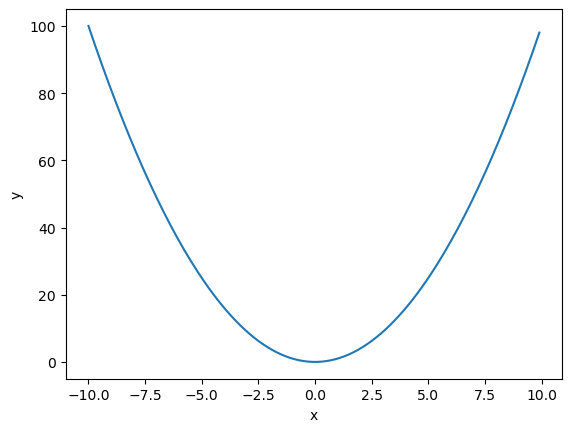

In [8]:
x = np.arange(-10,10,.1)

L = lambda x: x**2
y = L(x)

def ejemplo1(x,y):
    plt.plot(x,y)
    plt.xlabel("x")
    plt.ylabel("y");
    
ejemplo1(x,y)

$$ L(x_i) = x_i^2$$

$$ \frac{\partial L }{\partial x } = 2x$$

$$ w_{k+1} = w_{k} - \epsilon_x \frac{\partial L }{\partial x }  $$

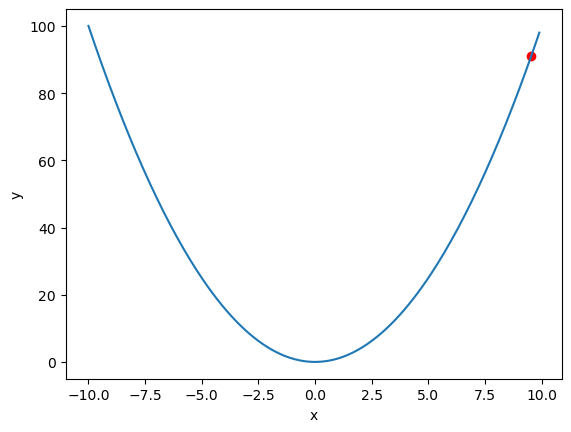

In [9]:
np.random.seed(9090)
w = np.random.uniform(-10,10)
ejemplo1(x,y)
plt.scatter(w,L(w),c='r');

In [10]:
epsilon=.99
#epsilon=.7
#epsilon=.1
dL = lambda x: 2*x
W = [w]

for i in range(10):
    w = w - epsilon*(dL(w))
    W.append(w)
    print("w=",w)
W = np.array(W)

w= -9.358073486941542
w= 9.17091201720271
w= -8.987493776858656
w= 8.807743901321484
w= -8.631589023295053
w= 8.45895724282915
w= -8.289778097972569
w= 8.123982536013116
w= -7.961502885292855
w= 7.802272827586998


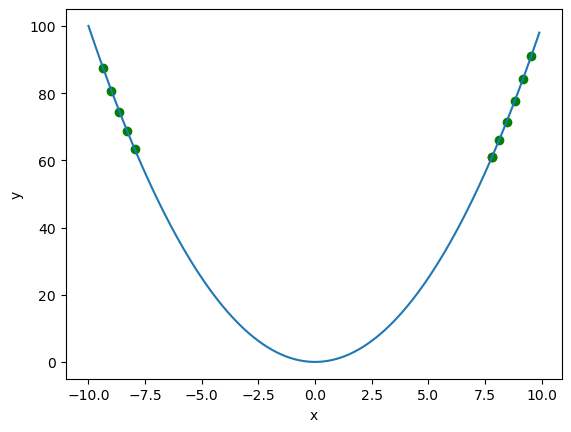

In [11]:
ejemplo1(x,y)
plt.scatter(w,L(w),c='r')
plt.scatter(W,L(W),c='g')

w= -9.358073486941542
w= 9.17091201720271
w= -8.987493776858656
w= 8.807743901321484
w= -8.631589023295053
w= 8.45895724282915
w= -8.289778097972569
w= 8.123982536013116
w= -7.961502885292855
w= 7.802272827586998


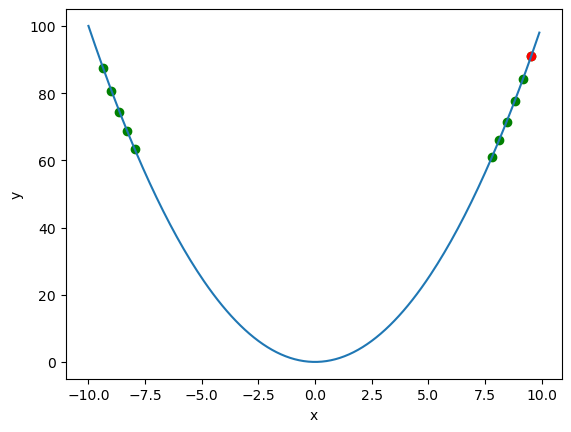

In [12]:
epsilon=.99
#epsilon=.7
#epsilon=.1
#epsilon=.01

np.random.seed(9090)
w = np.random.uniform(-10,10)
dL = lambda x: 2*x
W = [w]

for i in range(10):
    w = w - epsilon*(dL(w))
    W.append(w)
    print("w=",w)
W = np.array(W)

ejemplo1(x,y)
plt.scatter(W,L(W),c='g')
plt.scatter(W[0],L(W[0]),c='r')

In [13]:
#%matplotlib notebook

In [14]:

def GradDes(w=10 ,N=20,epsilon=.1):
    # Generate curve data
    
    x = np.linspace(-10, 10, 100)
    f = lambda t: t**2  
    df = lambda t: 2*t
    y = f(x)

    xm = np.min(x) - 1
    xM = np.max(x) + 1
    ym = np.min( y ) - 1
    yM = np.max( y ) + 1

    W = [w]
    for i in range(N):
        w = w - epsilon*(df(w))
        W.append(w)
        #print("w=",w)
    W = np.array(W)

    # Create figure
    fig = go.Figure(
        data=[go.Scatter(x=x, y=y,
                         mode="lines",
                         line=dict(width=2, color="blue")),
              go.Scatter(x=x, y=y,
                         mode="lines",
                         line=dict(width=2, color="blue"))],
        layout=go.Layout(
            xaxis=dict(range=[xm, xM], autorange=False, zeroline=False),
            yaxis=dict(range=[ym, yM], autorange=False, zeroline=False),
            title_text="Kinematic Generation of a Planar Curve", hovermode="closest",
            updatemenus=[dict(type="buttons",
                              buttons=[dict(label="Play",
                                            method="animate",
                                            args=[None])])]),
        frames=[go.Frame(
            data=[go.Scatter(
                x=[W[k]],
                y=[ f(W[k]) ],
                mode="markers",
                marker=dict(color="red", size=10))])

            for k in range(N)]
    )

    fig.show()


np.random.seed(9090)
w = np.random.uniform(-10,10)
GradDes(w)

In [15]:
GradDes(w,epsilon=1)

In [16]:
GradDes(w=1.5,epsilon=1.1)

In [17]:
GradDes(w=1.5,epsilon=.01)

# Regresión lineal

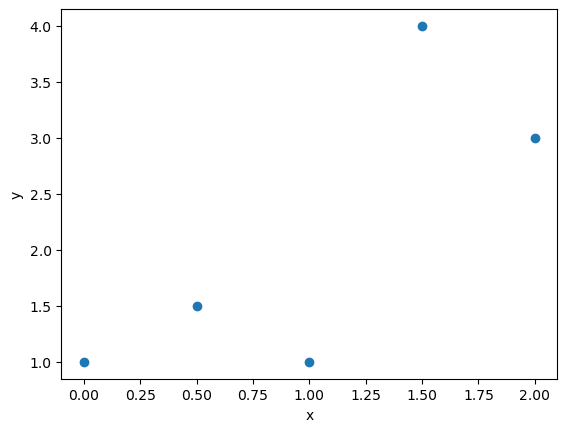

In [18]:
x = np.array( [0,1,2,1.5,0.5])
y = np.array( [1,1,3,4,1.5] )

plt.scatter(x,y)
plt.xlabel("x")
plt.ylabel("y");

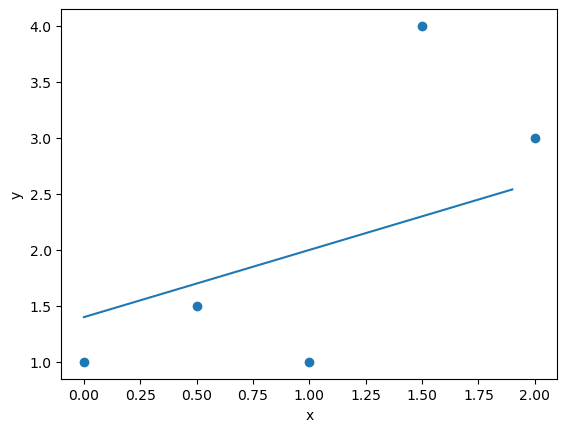

In [19]:
X = np.arange(0,2,.1)

w =.6
b = 1.4
g = lambda X : w*X + b
Y = g(X) # Mi modelo

plt.scatter(x,y)
plt.plot(X,Y)
plt.xlabel("x")
plt.ylabel("y");

In [20]:
from ipywidgets import interact,interact_manual

In [21]:
def G (w,b):
    X = np.arange(-1,3,.1)
    f = lambda X : w*X + b
    Y = f(X) # Mi modelo

    plt.scatter(x,y)
    plt.plot(X,Y)
    plt.xlabel("x")
    plt.ylabel("y");
    plt.show()


interact_manual(G, w=(0,5,.1),b=(0,5,.1));

interactive(children=(FloatSlider(value=2.0, description='w', max=5.0), FloatSlider(value=2.0, description='b'…

In [22]:
w,b

(0.6, 1.4)

$$ g(x_i) = wx_i + b $$

$$ E = \frac{1}{2}\sum_{i=0}^n  (g(x_i) - y_i)^2$$


$$  \frac{\partial E}{\partial w} = \sum_{i=0}^n (g(x_i) - y_i)(x_i) $$

$$  \frac{\partial E}{\partial b} = \sum_{i=0}^n (g(x_i) - y_i) $$  

$$ w_{k+1} = w_{k} - \epsilon_x \frac{\partial E }{\partial w }  $$

$$ b_{k+1} = b_{k} - \epsilon_b \frac{\partial E }{\partial b }  $$

In [23]:
x = np.array( [0,1,2,1.5,0.5])
y = np.array( [1,1,3,4,1.5] )

np.random.seed(9090)
w = np.random.uniform(-10,10)

b = np.random.uniform(-10,10)
e = .01

g = lambda X : w*X + b
#E = .5*(g(x) - y)**2

for i in range(500):
    wt = w - e*np.sum( (g(x) - y)*x )
    b = b - e*np.sum( (g(x) - y) )
    w =wt
    print("w=",w,"b=",b,"Error=", .5*np.sum( (g(x) - y)**2 ) )

w= 8.530568719555443 b= 7.983875816865497 Error= 586.2794332441558
w= 7.62908227474551 b= 7.26315359004445 Error= 460.6623491016686
w= 6.831243424637375 b= 6.623541796804952 Error= 362.05868584095543
w= 6.125223077949324 b= 6.055802535732836 Error= 284.65866574925786
w= 5.500541220316483 b= 5.551751255048727 Error= 223.90203459067382
w= 4.947913066040311 b= 5.104136631280467 Error= 176.2093231433832
w= 4.4591127545232645 b= 4.706534146414428 Error= 138.77090706656548
w= 4.026852590613299 b= 4.353251801367543 Error= 109.38143424911073
w= 3.644676056248924 b= 4.039246581768501 Error= 86.30986232934248
w= 3.3068630229418297 b= 3.76005044986763 Error= 68.19744760700435
w= 3.008345773727811 b= 3.511704776227157 Error= 53.97767376366013
w= 2.744634601886867 b= 3.2907022487294086 Error= 42.8134017357571
w= 2.5117518943088815 b= 3.093935406198595 Error= 34.04753693904994
w= 2.3061737319257856 b= 2.918651041173221 Error= 27.164306629954975
w= 2.1247781499726908 b= 2.7624098025182704 Error= 21.7

In [24]:
w,b

(1.2969497476886631, 0.8039066911939405)

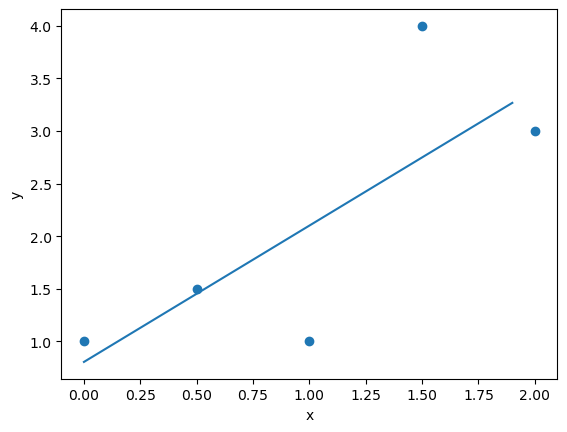

In [25]:
X = np.arange(0,2,.1)

g = lambda X : w*X + b
Y = g(X) # Mi modelo

plt.scatter(x,y)
plt.plot(X,Y)
plt.xlabel("x")
plt.ylabel("y");

In [26]:
#!pip install scikit-learn

In [27]:
from sklearn.linear_model import LinearRegression

In [28]:
#Reshape your data either using 
#array.reshape(-1, 1) if your data has a single feature or 
#array.reshape(1, -1) if it contains a single sample.

regressor = LinearRegression()  
regressor.fit(np.array(x).reshape(-1, 1), np.array(y).reshape(-1, 1) )


LinearRegression()

In [29]:
regressor.coef_,regressor.intercept_

(array([[1.3]]), array([0.8]))

In [30]:
w,b

(1.2969497476886631, 0.8039066911939405)

In [31]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [32]:
#%matplotlib notebook


In [33]:
# Datos de entrada
x = np.array( [0,1,2,1.5,0.5])
y = np.array( [1,1,3,4,1.5] )

np.random.seed(9090)
w = np.random.uniform(-10, 10)
b = np.random.uniform(-10, 10)
e = .01

delta = 2
line_x = np.arange(-delta, 2 + delta, .1)
g = lambda X: w*X + b


fig = make_subplots(rows=1, cols=1)
scatter = go.Scatter(x=x, y=y, mode='markers', name='Datos')
fig.add_trace(scatter)

frames = []
for i in range(500): # Ojo, esto puede tardar un poco, ejecutar con 50 iteraciones si se quiere ver más rápido pero el resultado es erroneo
    wt = w - e*np.sum( (g(x) - y)*x )
    b = b - e*np.sum( (g(x) - y) )
    w =wt
    #print("w=",w,"b=",b,"Error=", .5*np.sum( (g(x) - y)**2 ) )
    
    line = go.Scatter(x=line_x, y=g(line_x), mode='lines', name=f'Iteración {i}')
    #frames.append(go.Frame(data=[line]))
    frames.append(go.Frame(data=[scatter, line]))

# Añadir el primer frame
fig.add_trace(go.Scatter(x=line_x, y=g(line_x), mode='lines', name='Modelo inicial'))

# Configurar la animación
fig.frames = frames
fig.update_layout(
    #xaxis=dict(range=[x.min() - delta, x.max() + delta]),
    xaxis=dict(range=[ 0,3 ]),
    #yaxis=dict(range=[y.min() - delta, y.max() + delta]),
    yaxis=dict(range=[ 0,5 ]),
    updatemenus=[{
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 100, 'redraw': True}, 'fromcurrent': True}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }]
)


fig.show()

In [34]:
w,b,regressor.coef_,regressor.intercept_

(1.2969497476886631, 0.8039066911939405, array([[1.3]]), array([0.8]))

## Tarea generar una animacion en 3d de una funcion y encontrar su minimo por medio del descenso del gradiente. 

In [35]:
import plotly.graph_objects as go

n = 2
x = np.arange(-n,n,.1)
y = np.arange(-n,n,.1)

XX,YY = np.meshgrid(x,y)
##ZZ =  np.sin( XX**2 + YY**2)
#ZZ =  XX * np.exp( -XX**2 - YY**2)
ZZ = 7*XX*YY /( np.exp(XX**2 + YY**2 ) )

fig = go.Figure(go.Surface(
    contours = {
        "x": {"show": True, "start": 1.5, "end": 2, "size": 0.04, "color":"white"},
        "z": {"show": True, "start": 0.5, "end": 0.8, "size": 0.05}
    },
    x = XX,
    y = YY,
    z = ZZ))

fig.update_layout(
        scene = {
            "xaxis": {"nticks": 20},
            "zaxis": {"nticks": 4},
            'camera_eye': {"x": 0, "y": -1, "z": 0.5},
            "aspectratio": {"x": 1, "y": 1, "z": 0.2}
            
        })
fig.show()

Why Momentum Really Works

https://distill.pub/2017/momentum/



## Historia de las Redes Neuronales

https://nlaredo.tecnm.mx/takeyas/apuntes/Inteligencia%20Artificial/Apuntes/tareas_alumnos/RNA/Redes%20Neuronales2.pdf

# Clasificación 

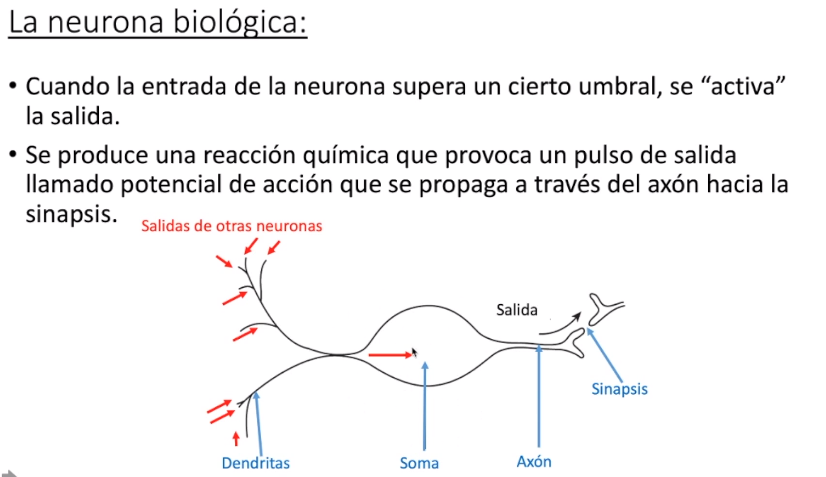

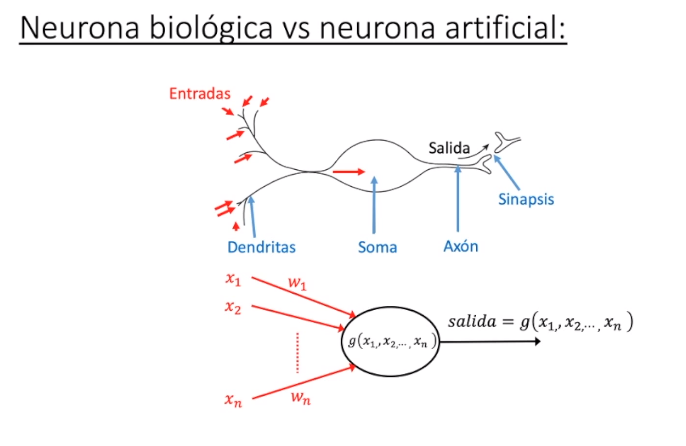

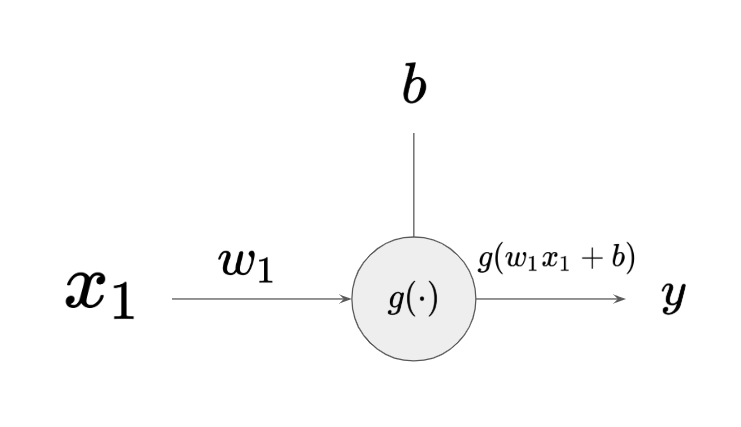

$$sigmoid(x) = \frac{1}{1 + e^{-x}} $$
$$\frac{d sigmoid}{dx}= sigmoid(x) (1- sigmoid(x) ) $$

***
$$\lambda = wx_i + b$$
$$ g(x_i) = sigmoid (\lambda) $$ 
***
$$ E = \frac{1}{2}\sum_{i=0}^n  (g(x_i) - y_i)^2$$

$$  \frac{\partial E}{\partial w} = \sum_{i=0}^n (g(x_i) - y_i)g'(x_i)(x_i) $$

$$  \frac{\partial E}{\partial b} = \sum_{i=0}^n (g(x_i) - y_i)g'(x_i) $$ 

***
$$ w_{k+1} = w_{k} - \epsilon_x \frac{\partial E }{\partial w }  $$

$$ b_{k+1} = b_{k} - \epsilon_b \frac{\partial E }{\partial w }  $$

$${\displaystyle S(x)={\frac {1}{1+e^{-x}}}={\frac {e^{x}}{e^{x}+1}}.}$$

In [36]:
# funciones de activacion redes neuronales
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def dsigmoid(x):
    return sigmoid(x)*(1- sigmoid(x) )

def logistic_sigmoid(x):
    return np.exp(x) / (1 + np.exp(x))


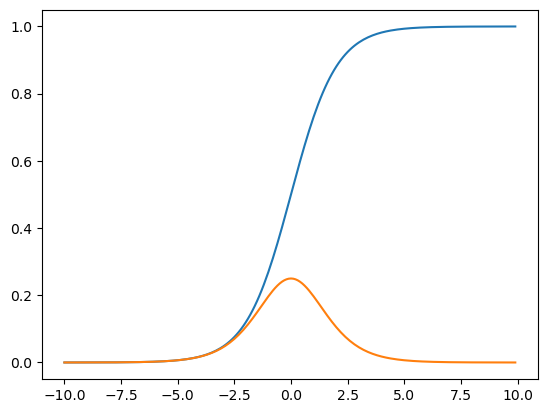

In [37]:
x = np.arange(-10,10,.1)
y = sigmoid(x)
y2 = logistic_sigmoid(x)
plt.plot(x,y)
#plt.plot(x,y2)
y2 = dsigmoid(x)

plt.plot(x,y2)

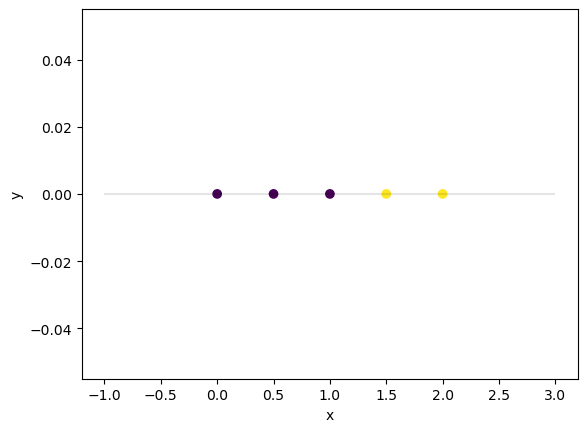

In [38]:
x = np.array( [0,1,2,1.5,0.5])
y = np.zeros(len(x))
clase = [0,0,1,1,0]

plt.scatter(x,y,c=clase)
plt.hlines(0,-1,3,colors=(0,0,0,.1))
plt.xlabel("x")
plt.ylabel("y");


In [39]:
x = np.array( [0,1,2,1.5,0.5])
clase = [0,0,1,1,0]

np.random.seed(90)
w = np.random.normal(0,1) #np.random.uniform(-10,10)
b = 1
epsilon = .01

g = lambda X : sigmoid(w*X + b)
dg = lambda X : dsigmoid(w*X + b)
#g = lambda X : logistic_sigmoid(w*X + b)
#E = .5*(g(x) - y)**2

for i in range(10000):
    
    wt = w - epsilon*np.sum( (g(x) - clase)*(dg(x)*x) )
    b = b - epsilon*np.sum( (g(x) - clase)*dg(x) )       
    w = wt
    
    #if i % 2000 == 0: # opcion 3
    #    
    #    print(f"{'Iter':<10}{'w':<20}{'b':<20}{'error':<20}")
    #    print(f"{i:<10}{w:<20}{b:<20}{5*np.sum( (g(x) - clase)):<20}")
    #    print("-"*70)
    #print(f"w={w}, b={b}, error=  {5*np.sum( (g(x) - clase))}" ) # opcion 2
        
print("error= ", .5*np.sum( (g(x) - clase))) # opcion 1

error=  0.039570330409735524


In [40]:
w,b

(3.4972083285126248, -4.25131168363632)

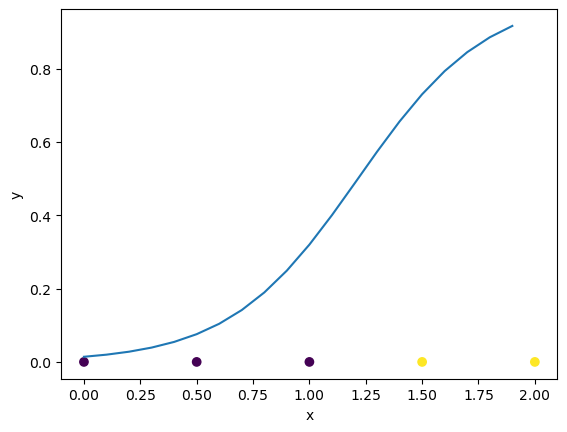

In [41]:
X = np.arange(0,2,.1)
Y = g(X) # Mi modelo

plt.scatter(x,y,c=clase)
plt.plot(X,Y)
plt.xlabel("x")
plt.ylabel("y");

In [42]:
w*x + b

array([-4.25131168, -0.75410336,  2.74310497,  0.99450081, -2.50270752])

In [43]:
g(x)

array([0.01404545, 0.31992786, 0.93952276, 0.729976  , 0.07566859])

In [44]:
clase

[0, 0, 1, 1, 0]

In [45]:
np.round( g(x) )

array([0., 0., 1., 1., 0.])

In [46]:
print("error= ", 1 - .5*np.sum( (g(x) - clase)  ))

error=  0.9604296695902644


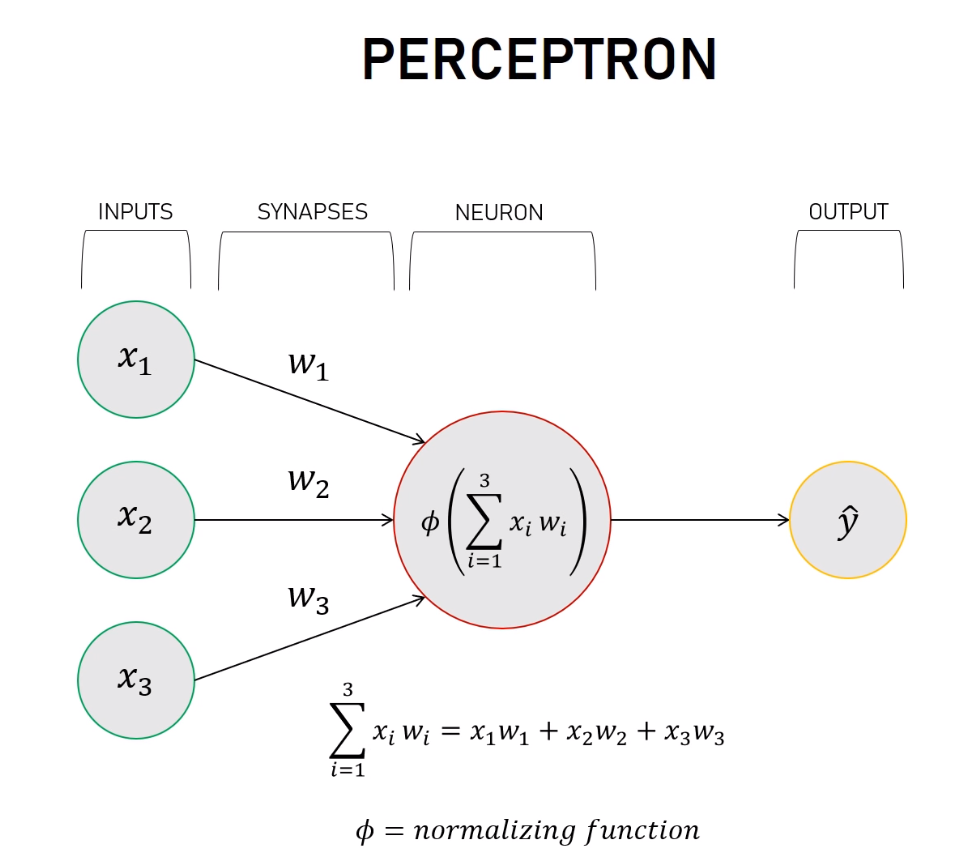

In [47]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))


def sigmoid_derivative(sigmoid):
    return sigmoid*(1 - sigmoid)

x = np.array([ [0,1,2,1.5,0.5],
               [1,1,3,4,1.5], 
               [1,1,1,1,1] ]).T

clase = np.array( [0,0,1,1,0])


print("clase:",clase.shape)
#clase = clase[:,np.newaxis]
#print("clase:",clase.shape)

clase: (5,)


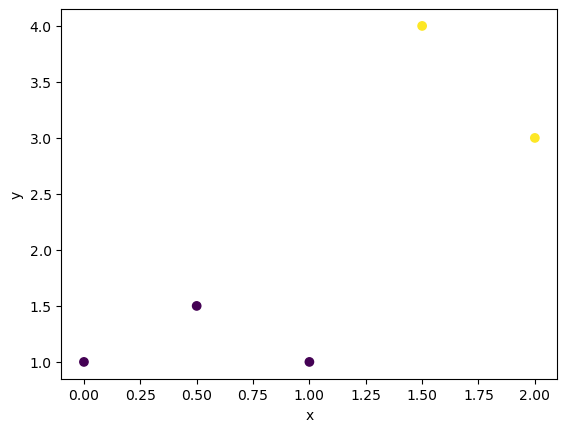

In [48]:
plt.scatter(x[:,0],x[:,1],c=clase)

plt.xlabel("x")
plt.ylabel("y");

In [49]:
print("clase:",clase.shape) # Extendemos la dimension de la variable clase para poder hacer los calculos
clase = clase[:,np.newaxis]
print("clase:",clase.shape)


clase: (5,)
clase: (5, 1)


In [50]:
#np.random.seed(9090)
np.random.seed(1)
w = np.random.normal(0,1,(3,1))

for i in range(1000):
    
    input_layer = x
    
    outputs = sigmoid (x@w)
    error = clase - outputs
    
    adjustments = error * sigmoid_derivative(outputs)
    w += x.T@ adjustments 
    
print("error= ", .5*np.sum( (sigmoid (x@w) - clase)))

error=  0.01554609932676879


In [51]:
sigmoid (x@w) #

array([[0.00375661],
       [0.03343617],
       [0.96890774],
       [0.99028677],
       [0.03470491]])

In [52]:
clase

array([[0],
       [0],
       [1],
       [1],
       [0]])

In [53]:
np.round( sigmoid (x@w) )

array([[0.],
       [0.],
       [1.],
       [1.],
       [0.]])

A simple explanation of how they work and how to implement one from scratch in Python

https://victorzhou.com/blog/intro-to-neural-networks/

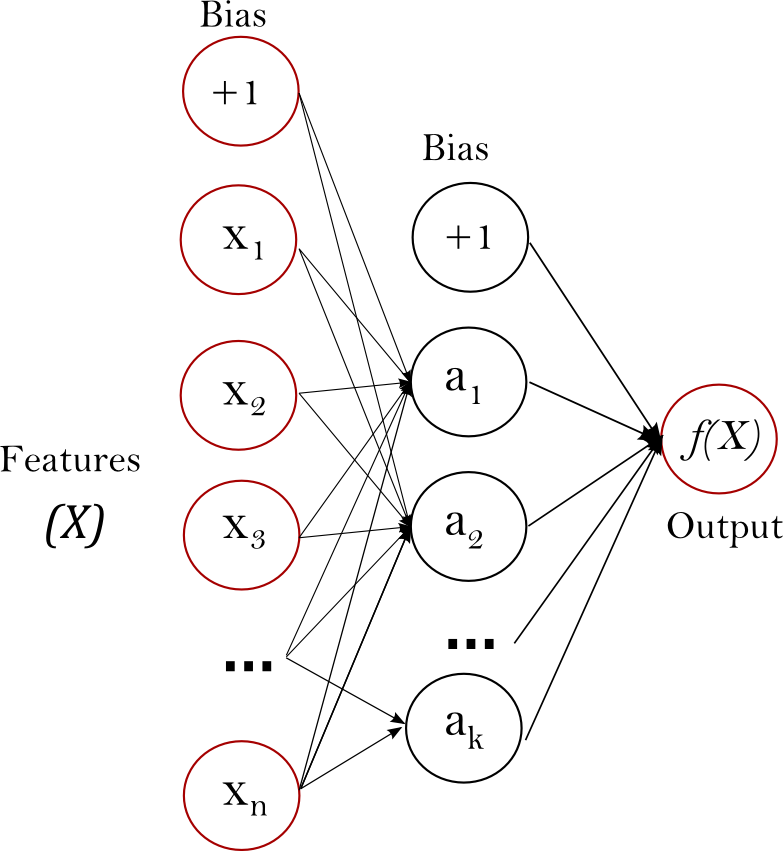

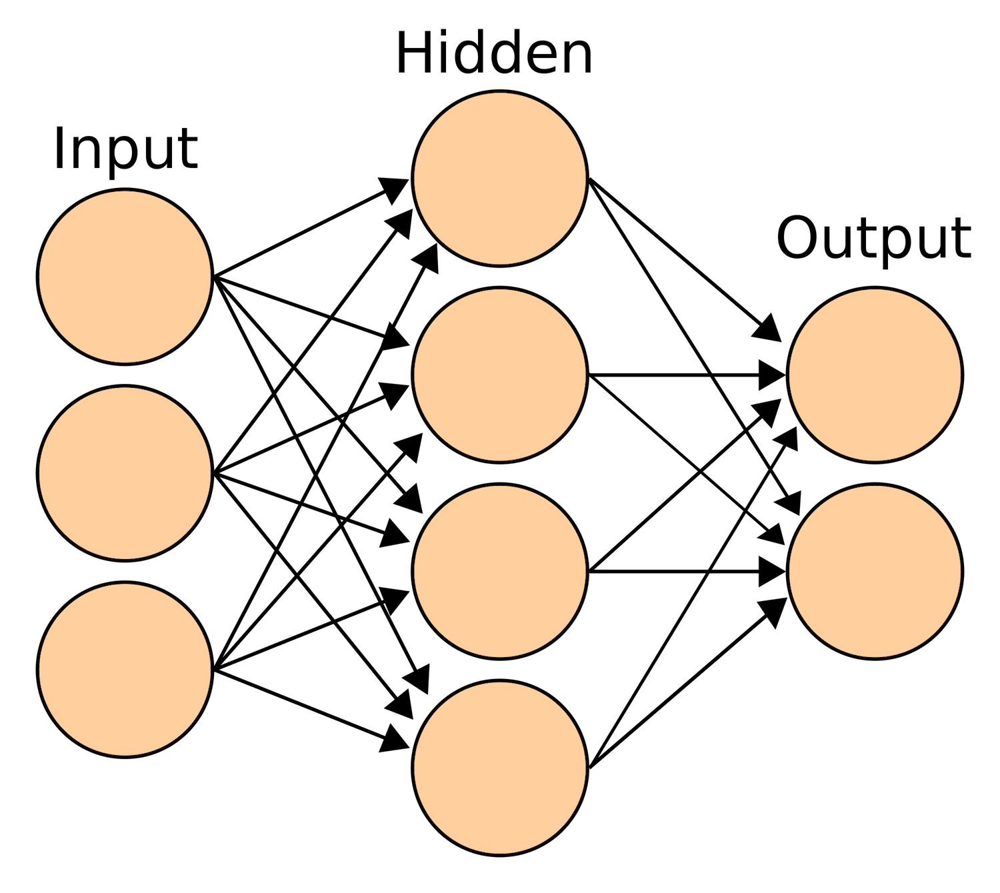

```mermaid
flowchart TD
    subgraph Input["Capa de Entrada"]
        I1[x₁]
        I2[x₂]
        I3[x₃]
    end

    subgraph Hidden1["Primera Capa Oculta"]
        H11[h₁₁]
        H12[h₁₂]
        H13[h₁₃]
    end

    subgraph Hidden2["Segunda Capa Oculta"]
        H21[h₂₁]
        H22[h₂₂]
    end

    subgraph Output["Capa de Salida"]
        O1[y₁]
    end

    %% Conexiones entre capas
    I1 --> H11 & H12 & H13
    I2 --> H11 & H12 & H13
    I3 --> H11 & H12 & H13

    H11 --> H21 & H22
    H12 --> H21 & H22
    H13 --> H21 & H22

    H21 --> O1
    H22 --> O1

    %% Estilos
    classDef inputLayer fill:#93c5fd,stroke:#1d4ed8
    classDef hiddenLayer fill:#a5b4fc,stroke:#4338ca
    classDef outputLayer fill:#f87171,stroke:#b91c1c

    class I1,I2,I3 inputLayer
    class H11,H12,H13,H21,H22 hiddenLayer
    class O1 outputLayer
```

## Bias

El "bias" (sesgo) en una red neuronal es un parámetro adicional que se utiliza para ajustar el comportamiento de cada neurona en la red. Es un valor constante que se suma ponderadamente a las entradas de una neurona antes de aplicar una función de activación.

El propósito principal del bias es permitir a la red neuronal aprender relaciones más complejas y expresar patrones no lineales en los datos. Sin un bias, el modelo solo podría aprender a ajustar líneas o planos a los datos de entrada, lo cual es limitado en términos de representación y generalización.

El bias introduce un término de desplazamiento o "sesgo" en la función de activación de cada neurona, lo que significa que incluso cuando todas las entradas son cero, el bias permite que la neurona produzca una salida diferente de cero. Esto permite que la red neuronal aprenda a modelar y predecir relaciones más generales y flexibles entre los datos de entrada y la salida deseada.

En resumen, el bias en las redes neuronales permite ajustar la posición de las funciones de activación y mejora la capacidad de generalización del modelo, lo que le permite aprender relaciones más complejas en los datos y hacer predicciones más precisas.

# Backpropagation calculus

https://www.youtube.com/watch?v=tIeHLnjs5U8

[01_3_Backpropagacion.ipynb](01_3_Backpropagacion.ipynb)


# Solución rápida ejemplo anterior

https://scikit-learn.org/stable/modules/neural_networks_supervised.html

In [54]:
from sklearn.neural_network import MLPClassifier

In [55]:
x = np.array([ [0,1,2,1.5,0.5],
               [1,1,3,4,1.5],
               [1,1,1,1,1] ]).T

y = np.array( [0,0,1,1,0])

In [56]:

clf = MLPClassifier(solver='lbfgs', alpha=1e-5,random_state=1)


In [57]:
MLPClassifier?

Init signature:
MLPClassifier(
    hidden_layer_sizes=(100,),
    activation='relu',
    *,
    solver='adam',
    alpha=0.0001,
    batch_size='auto',
    learning_rate='constant',
    learning_rate_init=0.001,
    power_t=0.5,
    max_iter=200,
    shuffle=True,
    random_state=None,
    tol=0.0001,
    verbose=False,
    warm_start=False,
    momentum=0.9,
    nesterovs_momentum=True,
    early_stopping=False,
    validation_fraction=0.1,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-08,
    n_iter_no_change=10,
    max_fun=15000,
)
Docstring:     
Multi-layer Perceptron classifier.

This model optimizes the log-loss function using LBFGS or stochastic
gradient descent.

.. versionadded:: 0.18

Parameters
----------
hidden_layer_sizes : array-like of shape(n_layers - 2,), default=(100,)
    The ith element represents the number of neurons in the ith
    hidden layer.

activation : {'identity', 'logistic', 'tanh', 'relu'}, default='relu'
    Activation function for the hidden laye

In [58]:
clf.fit(x, y)

MLPClassifier(alpha=1e-05, random_state=1, solver='lbfgs')

In [59]:
clf.predict(x)

array([0, 0, 1, 1, 0])

In [60]:
X = x[:,:2]
X

array([[0. , 1. ],
       [1. , 1. ],
       [2. , 3. ],
       [1.5, 4. ],
       [0.5, 1.5]])

**lbfgs** es un algoritmo de optimización utilizado para entrenar el modelo MLPClassifier. Es una abreviatura de **"Limited-memory Broyden–Fletcher–Goldfarb–Shanno"**. Este algoritmo es una variante del método BFGS que es adecuado para problemas con un gran número de parámetros.

[01_4_AlgoOptimizacion.ipynb](01_4_AlgoOptimizacion.ipynb)

In [61]:
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,hidden_layer_sizes=(5, 2), random_state=1)
#clf = MLPClassifier(solver='sgd', alpha=1e-5,hidden_layer_sizes=(5, 2), random_state=1,max_iter=10000,activation='logistic',learning_rate ="adaptive",learning_rate_init=0.0001)

clf.fit(X, y)

MLPClassifier(alpha=1e-05, hidden_layer_sizes=(5, 2), random_state=1,
              solver='lbfgs')

In [62]:
clf.predict([[2., 2.], [-1., -2.]])

array([1, 0])

In [63]:
clf.activation

'relu'

In [64]:
clf.score(X, y)

1.0

# Multi-layer Perceptron (MLP) 

In [65]:
#https://colab.research.google.com/drive/1vm1EAZ7lLRooZHqHTfUlul5ZXpGmb_SZ

In [67]:
from sklearn.datasets import make_circles
from sklearn.model_selection import train_test_split

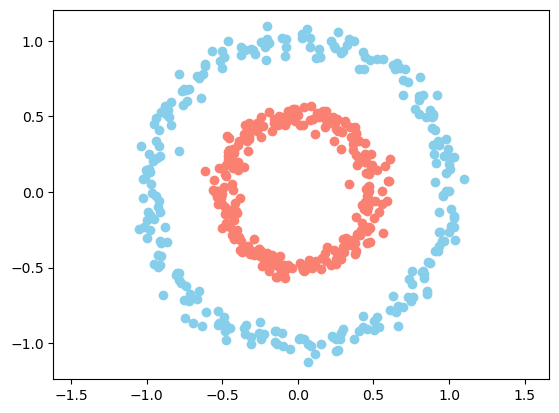

In [68]:
# CREAR EL DATASET

n = 500
p = 2

X, Y = make_circles(n_samples=n, factor=0.5, noise=0.05)

Y = Y[:, np.newaxis]

plt.scatter(X[Y[:, 0] == 0, 0], X[Y[:, 0] == 0, 1], c="skyblue")
plt.scatter(X[Y[:, 0] == 1, 0], X[Y[:, 0] == 1, 1], c="salmon")
plt.axis("equal")
plt.show()

In [69]:
X.shape,Y.shape

((500, 2), (500, 1))

In [70]:
#Y.reshape(-1).shape
Y = Y.reshape(-1) # Solo para quitar el warning A column-vector y was passed when a 1d array was expected.

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=1)


In [71]:
X_train.shape, X_test.shape

((335, 2), (165, 2))

In [72]:
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(4, 8), random_state=500)

clf.fit(X_train, y_train)

MLPClassifier(alpha=1e-05, hidden_layer_sizes=(4, 8), random_state=500,
              solver='lbfgs')

In [88]:
predictions = clf.predict(X_test)
predictions

array([0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1])

In [89]:
y_test.T

array([0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1])

In [90]:
predictions == y_test.T

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [91]:
clf.score(X_test,y_test)

0.9818181818181818

In [92]:
np.sum( predictions == y_test.T) / len(predictions)

0.9818181818181818

[01_5_Score.ipynb](01_5_Score.ipynb)

In [93]:
from sklearn.metrics import classification_report, confusion_matrix

In [94]:
print(confusion_matrix(y_test,predictions))
print(classification_report(y_test,predictions))

[[79  3]
 [ 0 83]]
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        82
           1       0.97      1.00      0.98        83

    accuracy                           0.98       165
   macro avg       0.98      0.98      0.98       165
weighted avg       0.98      0.98      0.98       165



- The precision is the ratio tp / (tp + fp) where tp is the number of true positives and fp the number of false positives. The precision is intuitively the ability of the classifier not to label as positive a sample that is negative.

- The recall is the ratio tp / (tp + fn) where tp is the number of true positives and fn the number of false negatives. The recall is intuitively the ability of the classifier to find all the positive samples.

- The F-beta score can be interpreted as a weighted harmonic mean of the precision and recall, where an F-beta score reaches its best value at 1 and worst score at 0.

- The F-beta score weights recall more than precision by a factor of beta. beta == 1.0 means recall and precision are equally important.

The support is the number of occurrences of each class in y_true.

https://scikit-learn.org/stable/modules/model_evaluation.html#precision-recall-f-measure-metrics

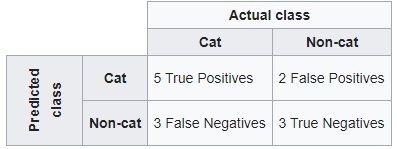

a table of confusion (sometimes also called a confusion matrix) https://en.wikipedia.org/wiki/Confusion_matrix

<tbody><tr>
<th style="background:linear-gradient(to top right,#eaecf0 49.5%,#aaa 49.5%,#aaa 50.5%,#eaecf0 50.5%);line-height:1;"><div style="margin-left:2em;text-align:right;">Actual<br>class</div><div style="margin-right:2em;text-align:left;">Predicted &nbsp;</div>
</th>
<th><abbr title="Positive">P</abbr>
</th>
<th><abbr title="Negative">N</abbr>
</th></tr>
<tr>
<th><abbr title="Positive">P</abbr>
</th>
<td><b><abbr title="True positive">TP</abbr></b>
</td>
<td><abbr title="False positive">FP</abbr>
</td></tr>
<tr>
<th><abbr title="Negative">N</abbr>
</th>
<td><abbr title="False negative">FN</abbr>
</td>
<td><b><abbr title="True negative">TN</abbr></b>
</td></tr></tbody>

In [95]:
clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(4, 8), random_state=1)

clf.fit(X_train, y_train)


MLPClassifier(alpha=1e-05, hidden_layer_sizes=(4, 8), random_state=1,
              solver='lbfgs')

In [96]:
#!pip install tensorflow

In [73]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense
import os

In [108]:
import os
import tensorflow as tf

def configurar_gpu():
    """
    Configura el entorno GPU de manera segura
    """
    try:
        # Limpiar sesión existente
        tf.keras.backend.clear_session()
        
        # Configurar nivel de logs
        os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
        
        # Listar GPUs disponibles
        gpus = tf.config.list_physical_devices('GPU')
        
        if gpus:
            try:
                # Intentar configurar memoria dinámica
                for gpu in gpus:
                    tf.config.experimental.set_memory_growth(gpu, True)
                print(f"GPU(s) configurada(s) con memoria dinámica: {len(gpus)}")
                
                # Opcional: Limitar memoria GPU
                # tf.config.experimental.set_virtual_device_configuration(
                #     gpus[0],
                #     [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024)]
                # )
                
            except RuntimeError as e:
                print(f"Error configurando GPU: {e}")
                
                # Plan B: Limitar a CPU si hay error con GPU
                os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
                print("Cambiando a modo CPU")
        else:
            print("No se encontraron GPUs, usando CPU")
            
    except Exception as e:
        print(f"Error inesperado: {e}")
        return False
        
    return True

# Usar la función al inicio del programa
if configurar_gpu():
    # Continuar con el resto del código
    print("\nConfiguración exitosa, procediendo con el programa...")
    
    # Verificar configuración final
    print("\nDispositivos disponibles:")
    devices = tf.config.list_physical_devices()
    for d in devices:
        print(f"  {d.device_type}: {d.name}")
else:
    print("Error en configuración, revisa los mensajes anteriores")

Error configurando GPU: Physical devices cannot be modified after being initialized
Cambiando a modo CPU

Configuración exitosa, procediendo con el programa...

Dispositivos disponibles:
  CPU: /physical_device:CPU:0
  GPU: /physical_device:GPU:0
  GPU: /physical_device:GPU:1


In [74]:
n = 500
p = 2

X, Y = make_circles(n_samples=n, factor=0.5, noise=0.05)

Y = Y[:, np.newaxis]


X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

#plt.scatter(X[Y[:, 0] == 0, 0], X[Y[:, 0] == 0, 1], c="skyblue")
#plt.scatter(X[Y[:, 0] == 1, 0], X[Y[:, 0] == 1, 1], c="salmon")
#plt.axis("equal")
#plt.show()

In [75]:
X.shape,Y.shape

((500, 2), (500, 1))

In [76]:
model = Sequential()
model.add( Dense(4, input_dim=2,activation = "relu") )
model.add( Dense(8, activation = "relu") )
model.add(Dense(1, activation='sigmoid'))

model.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ["accuracy"])
## model.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ['accuracy', 'mse']) 

/home/michel/anaconda3/envs/UP2024/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

I0000 00:00:1730926806.341911  437331 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 57 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 2080 Ti, pci bus id: 0000:17:00.0, compute capability: 7.5
I0000 00:00:1730926806.343311  437331 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 627 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 2080 Ti, pci bus id: 0000:65:00.0, compute capability: 7.5
2024-11-06 15:00:06.398665: I external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:1193] failed to allocate 57.56MiB (60358656 bytes) from device: RESOURCE_EXHAUSTED: : CUDA_ERROR_OUT_OF_MEMORY: out of memory
W0000 00:00:1730926806.7843

InternalError: {{function_node __wrapped__FloorMod_device_/job:localhost/replica:0/task:0/device:GPU:0}} 'cuLaunchKernel(function, gridX, gridY, gridZ, blockX, blockY, blockZ, 0, reinterpret_cast<CUstream>(stream), params, nullptr)' failed with 'CUDA_ERROR_INVALID_HANDLE' [Op:FloorMod] name: 


- In this case, we will use **cross entropy** as the loss argument. This loss is for a **binary classification** problems and is defined in Keras as **binary_crossentropy**. You can learn more about choosing loss functions based on your problem here:

https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/



- We will define the **optimizer** as **the efficient stochastic gradient descent algorithm “adam“**. This is a popular version of gradient descent because it automatically tunes itself and gives good results in a wide range of problems. To learn more about the Adam version of stochastic gradient descent see the post:

https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/

- Finally, because it is a classification problem, we will collect and report the classification accuracy, defined via the metrics argument.

-- The loss function is used to optimize your model. This is the function that will get minimized by the optimizer.

-- **A metric is used to judge the performance of your model. This is only for you to look at and has nothing to do with the optimization process.**

**Model Loss Functions**

Some common examples include:

- **mse**: for mean squared error. or MSE, loss is the default loss to use for regression problems.
- **binary_crossentropy**: for binary logarithmic loss (logloss).
- **categorical_crossentropy**: for multi-class logarithmic loss (logloss).


**Model Optimizers**

Some popular gradient descent optimizers you might like to choose from include:

- **SGD**: stochastic gradient descent, with support for momentum.
- **RMSprop**: adaptive learning rate optimization method proposed by Geoff Hinton.
- **Adam**: Adaptive Moment Estimation (Adam) that also uses adaptive learning rates.


**Model Metrics**

Metrics are evaluated by the model during training.

https://machinelearningmastery.com/build-multi-layer-perceptron-neural-network-models-keras/

# Fit Keras Model

https://machinelearningmastery.com/tutorial-first-neural-network-python-keras/


We can train or fit our model on our loaded data by calling the fit() function on the model.

Training occurs over epochs and each epoch is split into batches.

- **Epoch**: One pass through all of the rows in the training dataset.
- **Batch**: One or more samples considered by the model within an epoch before weights are updated.

In [97]:
model.fit(X_train,y_train, epochs=50, batch_size=10)

Epoch 1/50
34/34 [==============================] - 1s 2ms/step - loss: 0.6812 - accuracy: 0.4836
Epoch 2/50
34/34 [==============================] - 0s 1ms/step - loss: 0.6736 - accuracy: 0.4896
Epoch 3/50
34/34 [==============================] - 0s 1ms/step - loss: 0.6664 - accuracy: 0.5134
Epoch 4/50
34/34 [==============================] - 0s 1ms/step - loss: 0.6588 - accuracy: 0.5851
Epoch 5/50
34/34 [==============================] - 0s 1ms/step - loss: 0.6503 - accuracy: 0.6358
Epoch 6/50
34/34 [==============================] - 0s 2ms/step - loss: 0.6414 - accuracy: 0.6955
Epoch 7/50
34/34 [==============================] - 0s 4ms/step - loss: 0.6305 - accuracy: 0.7313
Epoch 8/50
34/34 [==============================] - 0s 2ms/step - loss: 0.6186 - accuracy: 0.7552
Epoch 9/50
34/34 [==============================] - 0s 2ms/step - loss: 0.6049 - accuracy: 0.7940
Epoch 10/50
34/34 [==============================] - 0s 1ms/step - loss: 0.5913 - accuracy: 0.8507
Epoch 11/50
34/34 [

In [110]:
model.fit?

If the model's prediction is perfect, the loss is zero; otherwise, the loss is greater. The goal of training a model is to find a set of weights and biases that have low loss, on average, across all examples. **Higher loss is the worse(bad prediction) for any model**.

The loss is calculated on training and validation and its interpretation is how well the model is doing for these two sets. Unlike accuracy, a loss is not a percentage. It is a sum of the errors made for each example in training or validation sets.

- A loss is a number indicating how bad the model's prediction was on a single example.



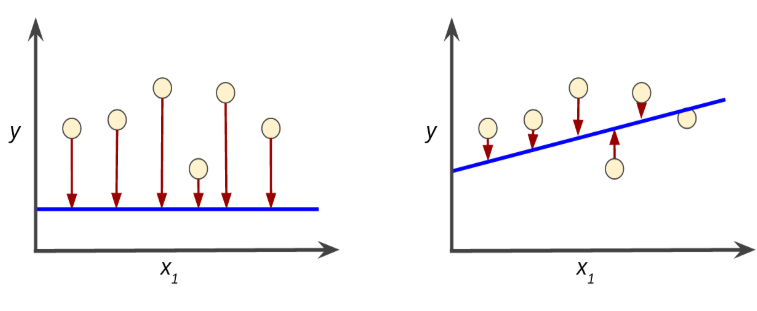

There are two graphs representing the losses of two different models, the left graph has a high loss and the right graph has a low loss.   

In [98]:
model.predict(X_test)

6/6 [==============================] - 0s 1ms/step


array([[0.01970717],
       [0.06283295],
       [0.03315766],
       [0.03416502],
       [0.01448948],
       [0.9844299 ],
       [0.8980659 ],
       [0.94760734],
       [0.04288517],
       [0.943721  ],
       [0.9770733 ],
       [0.01039996],
       [0.02363326],
       [0.94869334],
       [0.01142607],
       [0.0785192 ],
       [0.03219309],
       [0.91560537],
       [0.9846183 ],
       [0.9364628 ],
       [0.9780727 ],
       [0.9046667 ],
       [0.00422846],
       [0.9475972 ],
       [0.8893247 ],
       [0.97674215],
       [0.00923099],
       [0.9177025 ],
       [0.01393515],
       [0.09298666],
       [0.01642994],
       [0.00992249],
       [0.98478925],
       [0.91138035],
       [0.96288395],
       [0.10256705],
       [0.81751084],
       [0.03662933],
       [0.13352367],
       [0.01729669],
       [0.9695079 ],
       [0.92156523],
       [0.8998432 ],
       [0.00833162],
       [0.22023852],
       [0.74154294],
       [0.89164585],
       [0.078

In [112]:
y_test

array([[1],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
    

In [99]:
model.evaluate(X_test, y_test)

6/6 [==============================] - 0s 2ms/step - loss: 0.0654 - accuracy: 1.0000


[0.06539982557296753, 1.0]

In [100]:
loss, accuracy = model.evaluate(X_test, y_test)
print('Loss: %.2f  and Accuracy: %.2f' % (loss, accuracy*100))

6/6 [==============================] - 0s 1ms/step - loss: 0.0654 - accuracy: 1.0000
Loss: 0.07  and Accuracy: 100.00


In [101]:
n = 500
p = 2

X, Y = make_circles(n_samples=n, factor=0.5, noise=0.05)

Y = Y[:, np.newaxis]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

#plt.scatter(X[Y[:, 0] == 0, 0], X[Y[:, 0] == 0, 1], c="skyblue")
#plt.scatter(X[Y[:, 0] == 1, 0], X[Y[:, 0] == 1, 1], c="salmon")
#plt.axis("equal")
#plt.show()

In [102]:
model = Sequential()
model.add( Dense(4, input_dim=2,activation = "relu") )
model.add( Dense(8, activation = "relu") )
model.add(Dense(1, activation='sigmoid'))

model.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ["accuracy"])
#history = model.fit(X_train,y_train, epochs=50, batch_size=10)
history = model.fit(X_train,y_train,validation_data=(X_test, y_test), epochs=50, batch_size=10)

Epoch 1/50
34/34 [==============================] - 1s 5ms/step - loss: 0.6656 - accuracy: 0.4955 - val_loss: 0.6693 - val_accuracy: 0.5212
Epoch 2/50
34/34 [==============================] - 0s 2ms/step - loss: 0.6595 - accuracy: 0.5164 - val_loss: 0.6643 - val_accuracy: 0.5394
Epoch 3/50
34/34 [==============================] - 0s 3ms/step - loss: 0.6536 - accuracy: 0.5254 - val_loss: 0.6594 - val_accuracy: 0.5455
Epoch 4/50
34/34 [==============================] - 0s 2ms/step - loss: 0.6478 - accuracy: 0.5284 - val_loss: 0.6535 - val_accuracy: 0.5576
Epoch 5/50
34/34 [==============================] - 0s 6ms/step - loss: 0.6395 - accuracy: 0.5612 - val_loss: 0.6467 - val_accuracy: 0.5515
Epoch 6/50
34/34 [==============================] - 0s 3ms/step - loss: 0.6314 - accuracy: 0.6418 - val_loss: 0.6383 - val_accuracy: 0.6000
Epoch 7/50
34/34 [==============================] - 0s 2ms/step - loss: 0.6229 - accuracy: 0.6537 - val_loss: 0.6310 - val_accuracy: 0.6000
Epoch 8/50
34/34 [==

In [103]:
print("Train:")
loss,accuracy = model.evaluate(X_train,y_train,verbose=0)
print('Loss: %.2f  and Accuracy: %.2f' % (loss, accuracy*100))

print("Test:")
loss, accuracy = model.evaluate(X_test, y_test,verbose=0)
print('Loss: %.2f  and Accuracy: %.2f' % (loss, accuracy*100))

Train:
Loss: 0.10  and Accuracy: 100.00
Test:
Loss: 0.10  and Accuracy: 100.00


<IPython.core.display.Javascript object>


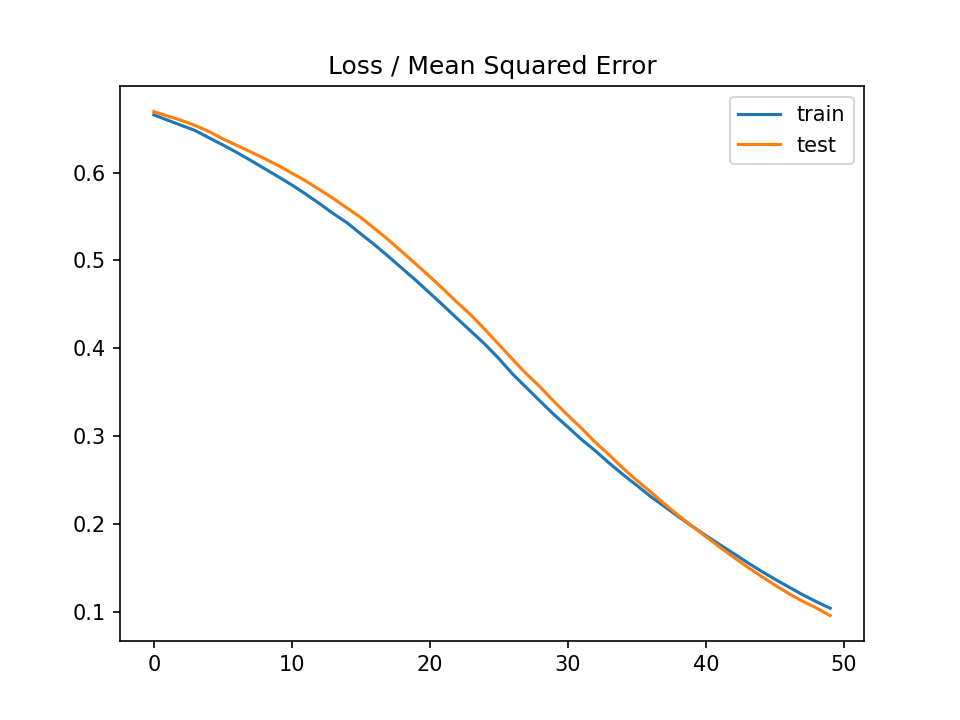

In [104]:
# plot loss during training
plt.title('Loss / Mean Squared Error')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

https://nextjournal.com/gkoehler/digit-recognition-with-keras

https://www.tensorflow.org/tutorials/quickstart/beginner

In [105]:
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()

x_train, x_test = x_train / 255.0, x_test / 255.0

In [108]:
x_train.shape

(60000, 28, 28)

In [106]:
x_train[0].shape

(28, 28)

<IPython.core.display.Javascript object>


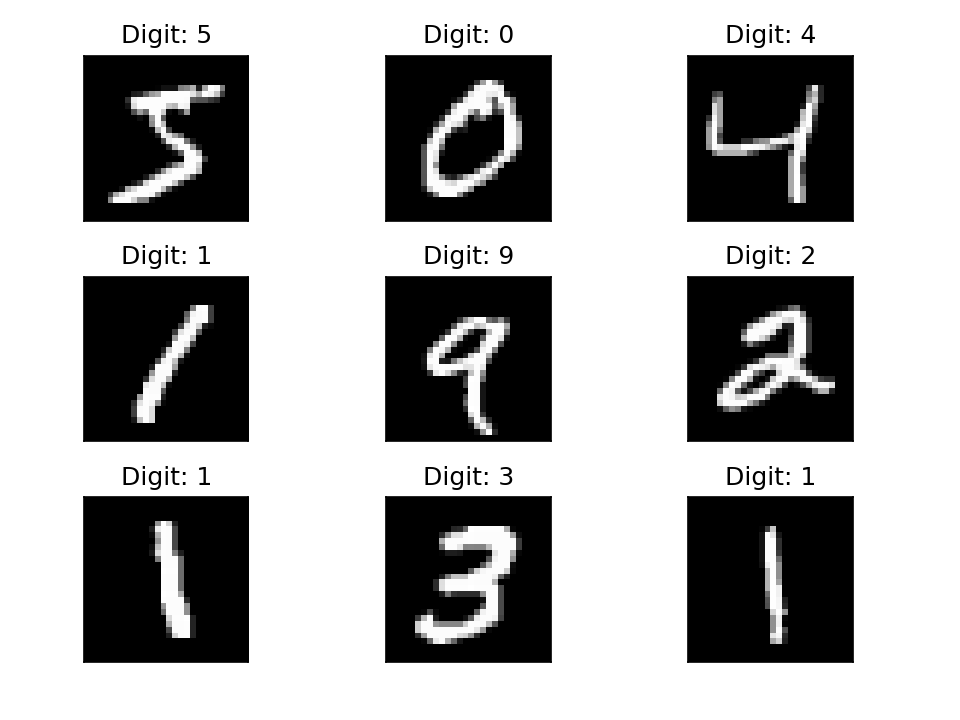

In [107]:
fig = plt.figure()
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.tight_layout()
    plt.imshow(x_train[i], cmap='gray', interpolation='none')
    plt.title("Digit: {}".format(y_train[i]))
    plt.xticks([])
    plt.yticks([])
#fig

In order to train our neural network to classify images we first have to unroll the height width pixel format into one big vector - the input vector.

So its length must be 28*28 =784 


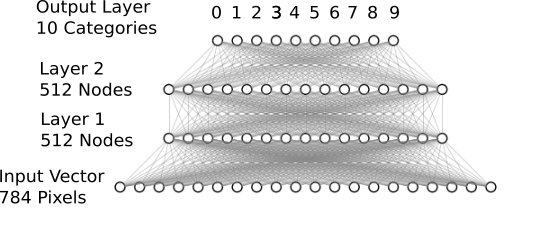

In [109]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [110]:
model.fit(x_train, y_train, epochs=5)

model.evaluate(x_test,  y_test, verbose=2)

Epoch 1/5
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2601 - accuracy: 0.9259
Epoch 2/5
1875/1875 [==============================] - 4s 2ms/step - loss: 0.1132 - accuracy: 0.9659
Epoch 3/5
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0762 - accuracy: 0.9772
Epoch 4/5
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0573 - accuracy: 0.9830
Epoch 5/5
1875/1875 [==============================] - 4s 2ms/step - loss: 0.0450 - accuracy: 0.9866
313/313 - 0s - loss: 0.0740 - accuracy: 0.9772 - 450ms/epoch - 1ms/step


[0.07401604950428009, 0.9771999716758728]

In [111]:
from keras.layers.core import Dense, Dropout, Activation, Flatten

In [112]:
model = Sequential()
model.add(Flatten(input_shape=(28, 28)) )
model.add(Dense(128,activation = "relu") )
model.add(Dropout(0.2))
model.add(Dense(10,activation = "softmax" ) )

model.compile(loss='sparse_categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

In [113]:
# building a linear stack of layers with the sequential model
model = Sequential()
model.add(Flatten(input_shape=(28, 28)) )
model.add(Dense(512))
model.add(Activation('relu'))                            
model.add(Dropout(0.2))

model.add(Dense(512,activation = "relu") )
model.add(Dropout(0.2))
model.add(Dense(10,activation = "softmax" ) )

# compiling the sequential model
model.compile(loss='sparse_categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

In [114]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 784)               0         
                                                                 
 dense_12 (Dense)            (None, 512)               401920    
                                                                 
 activation (Activation)     (None, 512)               0         
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_13 (Dense)            (None, 512)               262656    
                                                                 
 dropout_2 (Dropout)         (None, 512)               0         
                                                                 
 dense_14 (Dense)            (None, 10)               

In [594]:
#model.fit(x_train, y_train,batch_size=128, epochs=20)

In [141]:
# training the model and saving metrics in history
history = model.fit(x_train, y_train,
          batch_size=128, epochs=20,
          verbose=2,
          validation_data=(x_test,  y_test))

Epoch 1/20
469/469 - 5s - loss: 0.2520 - accuracy: 0.9240 - val_loss: 0.1029 - val_accuracy: 0.9679 - 5s/epoch - 11ms/step
Epoch 2/20
469/469 - 4s - loss: 0.1003 - accuracy: 0.9693 - val_loss: 0.0819 - val_accuracy: 0.9729 - 4s/epoch - 8ms/step
Epoch 3/20
469/469 - 4s - loss: 0.0706 - accuracy: 0.9780 - val_loss: 0.0740 - val_accuracy: 0.9774 - 4s/epoch - 8ms/step
Epoch 4/20
469/469 - 4s - loss: 0.0562 - accuracy: 0.9827 - val_loss: 0.0671 - val_accuracy: 0.9780 - 4s/epoch - 9ms/step
Epoch 5/20
469/469 - 4s - loss: 0.0459 - accuracy: 0.9855 - val_loss: 0.0760 - val_accuracy: 0.9771 - 4s/epoch - 8ms/step
Epoch 6/20
469/469 - 4s - loss: 0.0402 - accuracy: 0.9868 - val_loss: 0.0655 - val_accuracy: 0.9807 - 4s/epoch - 9ms/step
Epoch 7/20
469/469 - 4s - loss: 0.0340 - accuracy: 0.9885 - val_loss: 0.0622 - val_accuracy: 0.9822 - 4s/epoch - 9ms/step
Epoch 8/20
469/469 - 4s - loss: 0.0303 - accuracy: 0.9901 - val_loss: 0.0665 - val_accuracy: 0.9820 - 4s/epoch - 8ms/step
Epoch 9/20
469/469 - 4s

<IPython.core.display.Javascript object>


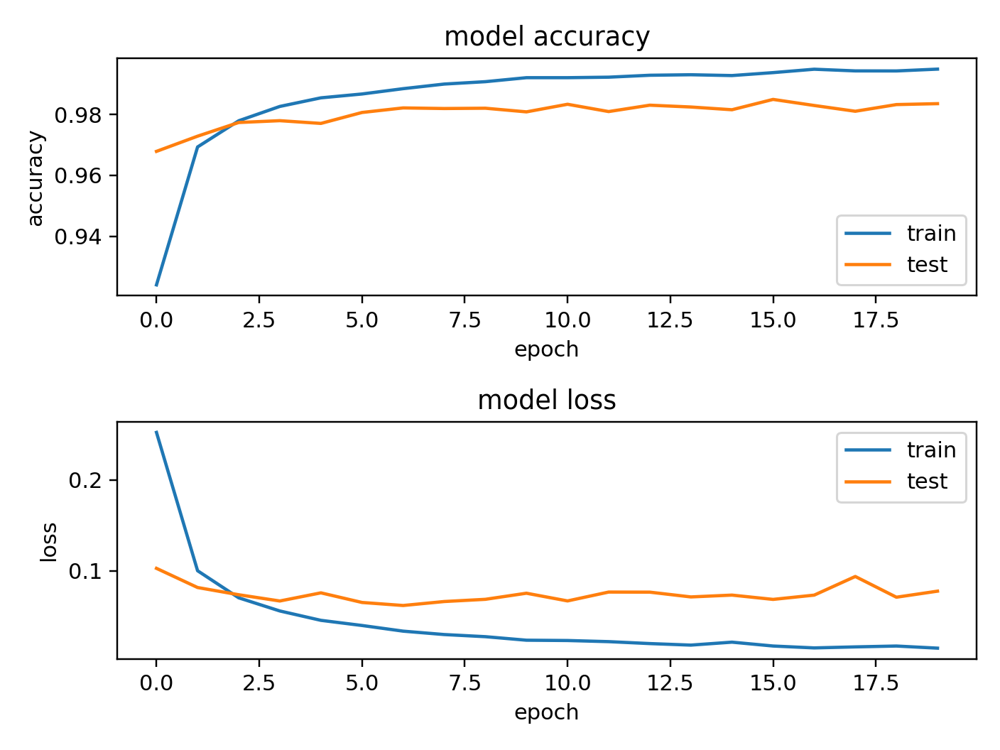

In [142]:


# plotting the metrics
fig = plt.figure()
plt.subplot(2,1,1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')

plt.tight_layout()

In [143]:
import os

In [146]:
model_path

'results/keras_mnist.h5'

In [616]:
model.save?

In [145]:
# saving the model
#os.mkdir("results")
save_dir = "results/"
model_name = 'keras_mnist.h5'
model_path = os.path.join(save_dir, model_name)
model.save(model_path)
print('Saved trained model at %s ' % model_path)

Saved trained model at results/keras_mnist.h5 


In [147]:
from keras.models import load_model

In [148]:
model.fit(x_train, y_train,
          batch_size=128, epochs=20,
          verbose=2,
          validation_data=(x_test,  y_test))

Epoch 1/20
469/469 - 4s - loss: 0.0116 - accuracy: 0.9962 - val_loss: 0.0979 - val_accuracy: 0.9813 - 4s/epoch - 8ms/step
Epoch 2/20
469/469 - 4s - loss: 0.0161 - accuracy: 0.9947 - val_loss: 0.0782 - val_accuracy: 0.9834 - 4s/epoch - 8ms/step
Epoch 3/20
469/469 - 4s - loss: 0.0142 - accuracy: 0.9952 - val_loss: 0.0802 - val_accuracy: 0.9837 - 4s/epoch - 9ms/step
Epoch 4/20
469/469 - 4s - loss: 0.0119 - accuracy: 0.9963 - val_loss: 0.0964 - val_accuracy: 0.9822 - 4s/epoch - 8ms/step
Epoch 5/20
469/469 - 4s - loss: 0.0129 - accuracy: 0.9958 - val_loss: 0.0833 - val_accuracy: 0.9836 - 4s/epoch - 8ms/step
Epoch 6/20
469/469 - 4s - loss: 0.0139 - accuracy: 0.9954 - val_loss: 0.1055 - val_accuracy: 0.9791 - 4s/epoch - 8ms/step
Epoch 7/20
469/469 - 4s - loss: 0.0158 - accuracy: 0.9951 - val_loss: 0.0796 - val_accuracy: 0.9844 - 4s/epoch - 8ms/step
Epoch 8/20
469/469 - 4s - loss: 0.0121 - accuracy: 0.9964 - val_loss: 0.0718 - val_accuracy: 0.9854 - 4s/epoch - 8ms/step
Epoch 9/20
469/469 - 4s 

In [160]:
y_pred = mnist_model.predict(x_test)
#[i for i,prob in enumerate(y_pred) if prob > 0.5]

313/313 [==============================] - 1s 2ms/step


In [166]:
y_pred.shape

(10000, 10)

array([7, 2, 1, ..., 4, 5, 6])

313/313 [==============================] - 1s 2ms/step

9836  classified correctly
164  classified incorrectly


<IPython.core.display.Javascript object>


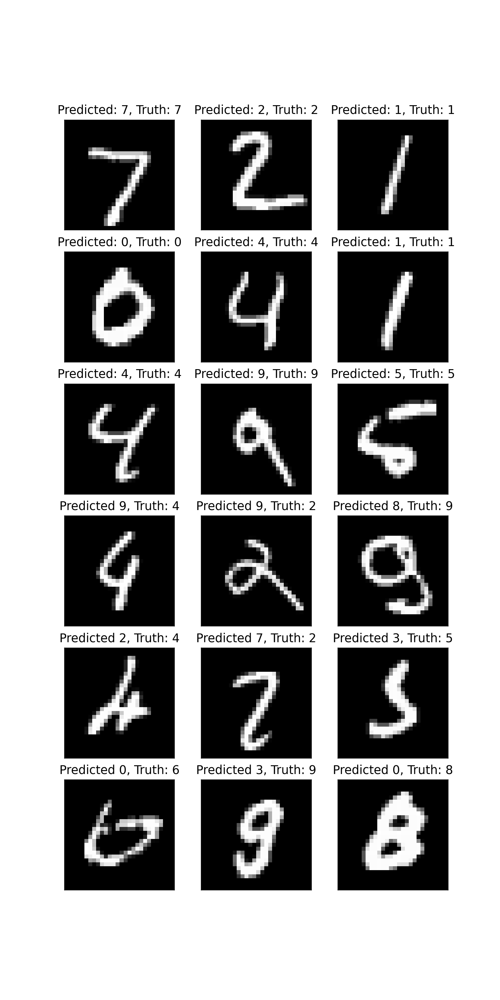

In [172]:
# load the model and create predictions on the test set
mnist_model = load_model(model_path)
y_pred = mnist_model.predict(x_test)
predicted_classes = np.argmax( y_pred, axis=1)

# see which we predicted correctly and which not
correct_indices = np.nonzero(predicted_classes == y_test)[0]
incorrect_indices = np.nonzero(predicted_classes != y_test)[0]
print()
print(len(correct_indices)," classified correctly")
print(len(incorrect_indices)," classified incorrectly")

# adapt figure size to accomodate 18 subplots
plt.rcParams['figure.figsize'] = (7,14)

figure_evaluation = plt.figure()

# plot 9 correct predictions
for i, correct in enumerate(correct_indices[:9]):
    plt.subplot(6,3,i+1)
    plt.imshow(x_test[correct].reshape(28,28), cmap='gray', interpolation='none')
    plt.title(
      "Predicted: {}, Truth: {}".format(predicted_classes[correct],
                                        y_test[correct]))
    plt.xticks([])
    plt.yticks([])

# plot 9 incorrect predictions
for i, incorrect in enumerate(incorrect_indices[:9]):
    plt.subplot(6,3,i+10)
    plt.imshow(x_test[incorrect].reshape(28,28), cmap='gray', interpolation='none')
    plt.title(
      "Predicted {}, Truth: {}".format(predicted_classes[incorrect], 
                                       y_test[incorrect]))
    plt.xticks([])
    plt.yticks([])

#figure_evaluation

## Clasificacion Basica: Predecir una imagen de moda



https://colab.research.google.com/github/tensorflow/docs-l10n/blob/master/site/es/tutorials/keras/classification.ipynb#scrollTo=R32zteKHCaXT

## Convolutional Neural Network (CNN)

In [115]:

from tensorflow.keras import datasets, layers, models

Download and prepare the CIFAR10 dataset

The CIFAR10 dataset contains 60,000 color images in 10 classes, with 6,000 images in each class. The dataset is divided into 50,000 training images and 10,000 testing images. The classes are mutually exclusive and there is no overlap between them.

https://www.tensorflow.org/tutorials/images/cnn

https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/images/cnn.ipynb

In [8]:
(train_images, train_labels), (test_images, test_labels) = datasets.cifar10.load_data()

# Normalize pixel values to be between 0 and 1
train_images, test_images = train_images / 255.0, test_images / 255.0

170498071/170498071 [==============================] - 650s 4us/step


In [9]:
train_images.shape

(50000, 32, 32, 3)

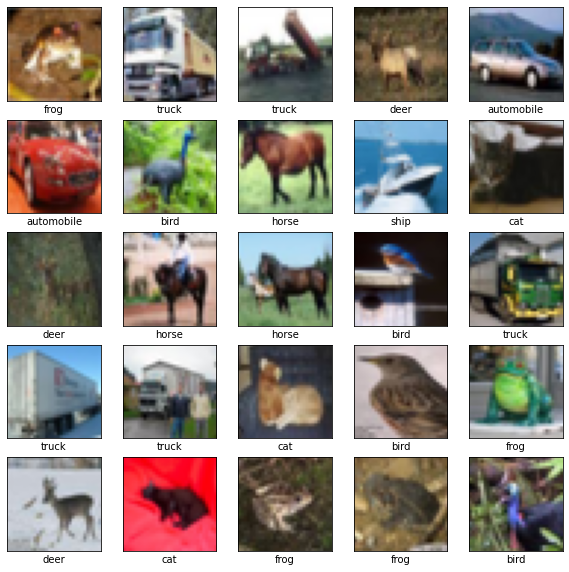

In [10]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    # The CIFAR labels happen to be arrays, 
    # which is why you need the extra index
    plt.xlabel(class_names[train_labels[i][0]])
plt.show()

Create the convolutional base

As input, a CNN takes tensors of shape (image_height, image_width, color_channels), ignoring the batch size. 

If you are new to these dimensions, color_channels refers to (R,G,B). 

In this example, you will configure our CNN to process inputs of shape (32, 32, 3), which is the format of CIFAR images. You can do this by passing the argument input_shape to our first layer.

In [11]:

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3) )) #,padding="same"))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10))


In [12]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 64)          36928     
                                                                 
 flatten (Flatten)           (None, 1024)              0

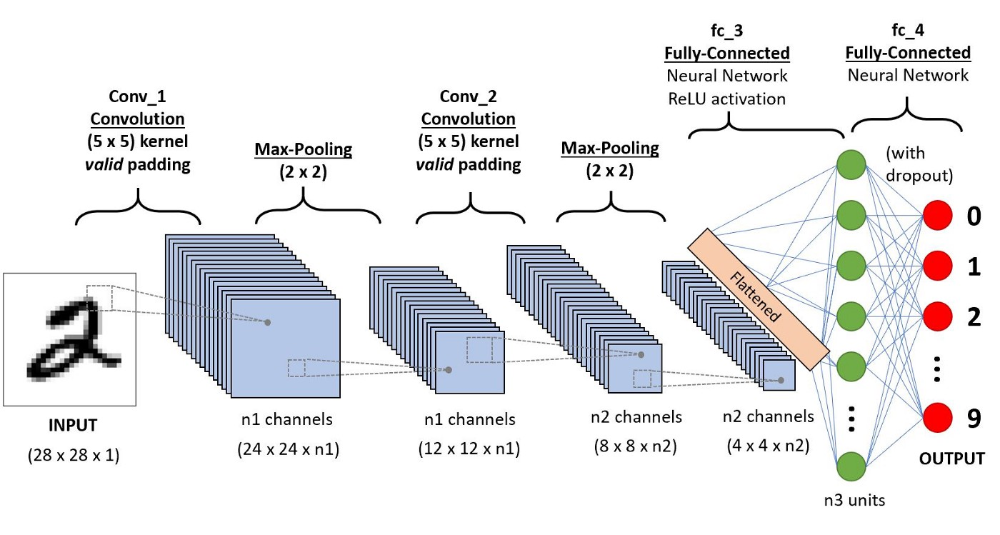

Convolution 
![SegmentLocal](keras_conv2d_padding.gif "segment")

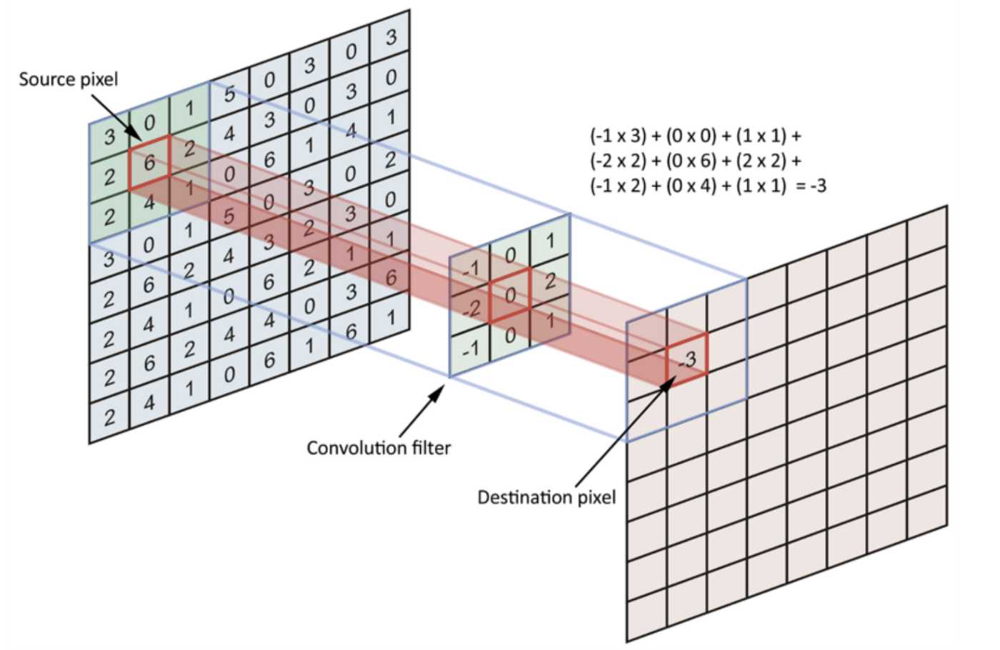

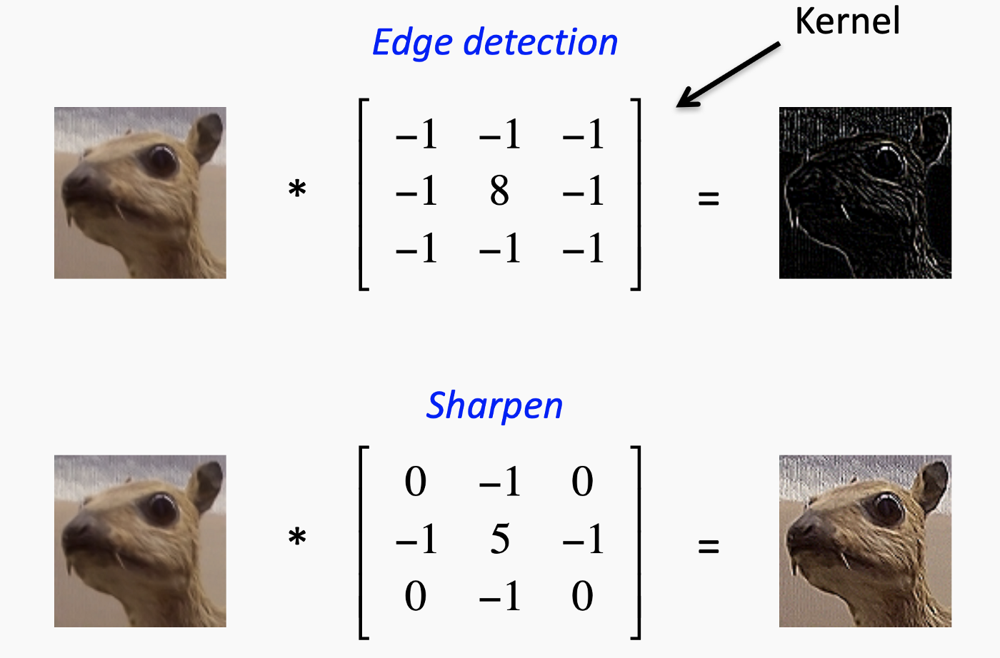

Padding
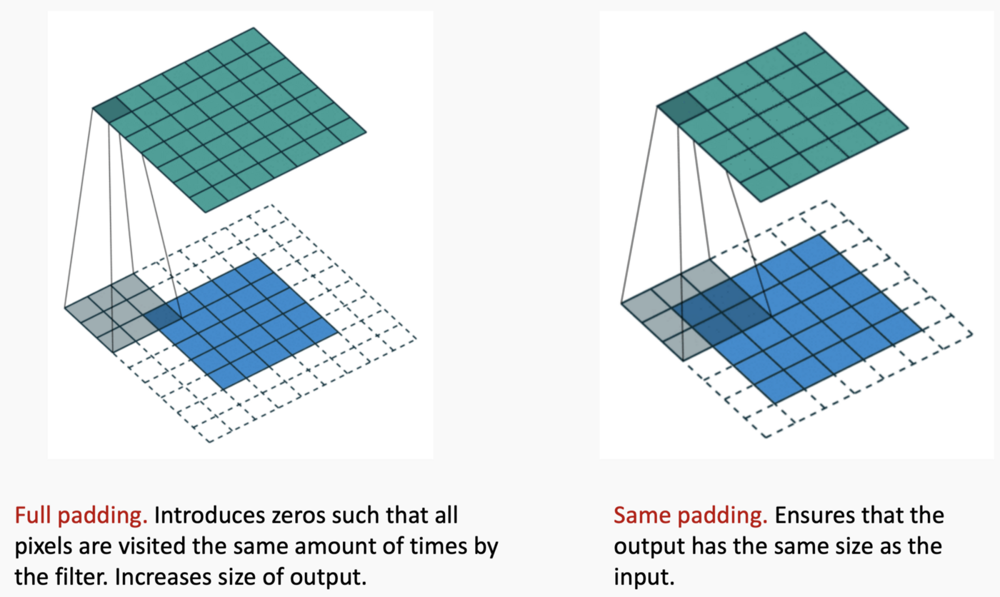


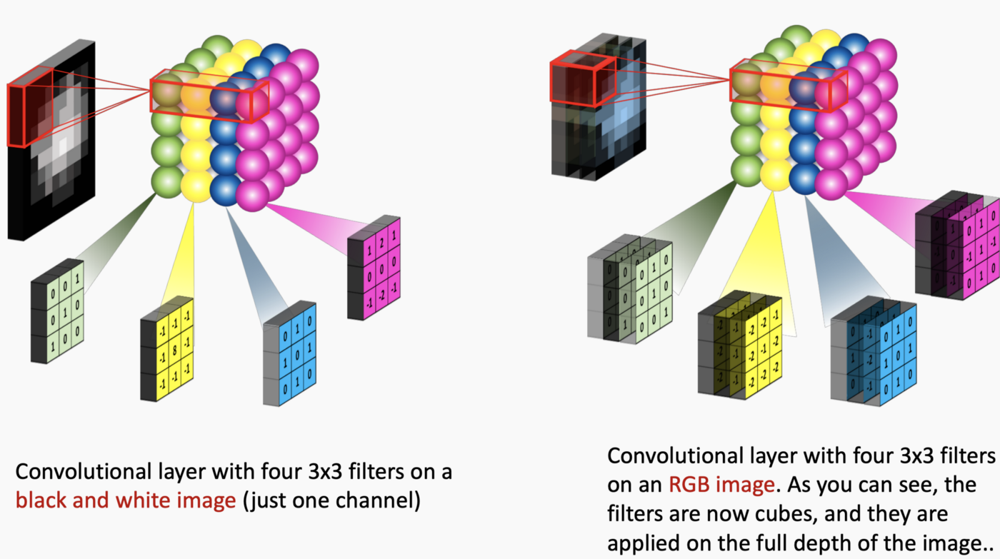

https://towardsdatascience.com/simple-introduction-to-convolutional-neural-networks-cdf8d3077bac

The role of the ConvNet is to reduce the images into a form which is easier to process, without losing features which are critical for getting a good prediction. 

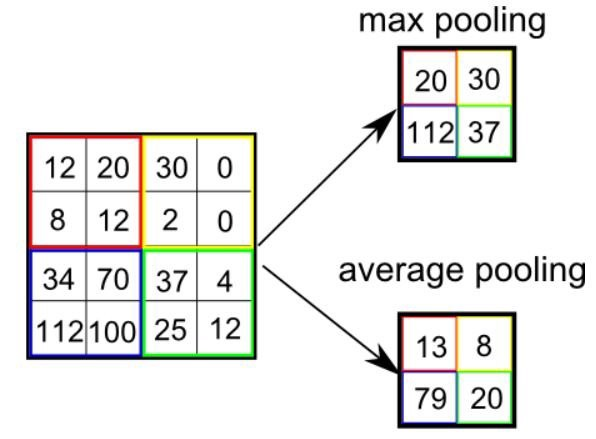

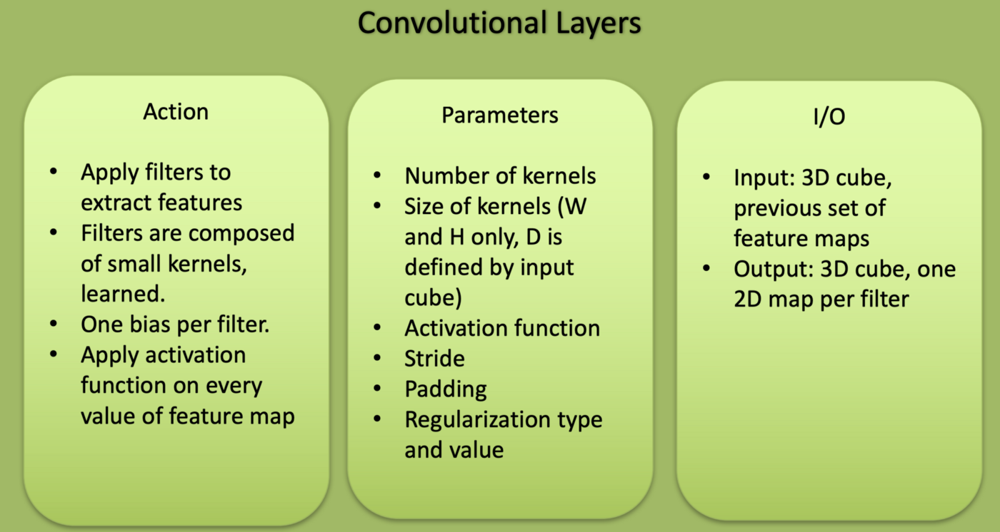

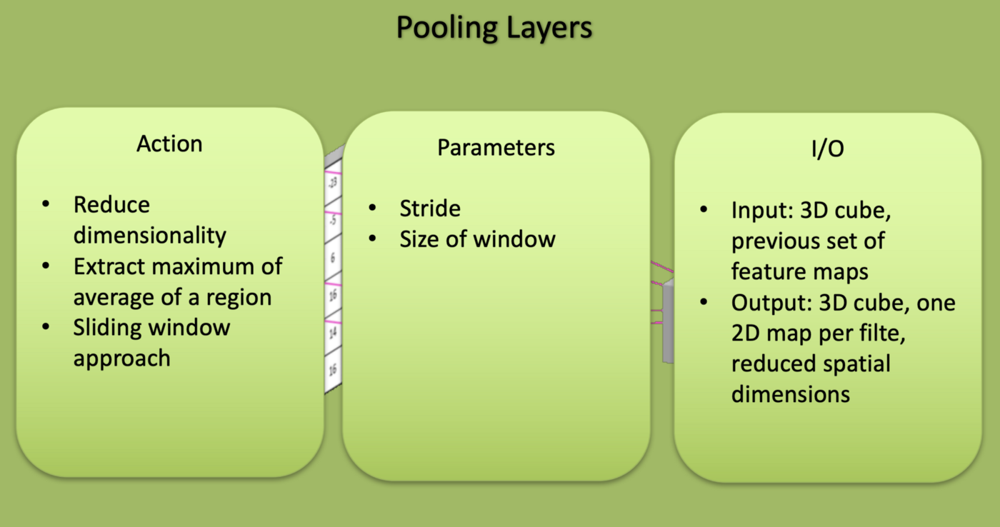

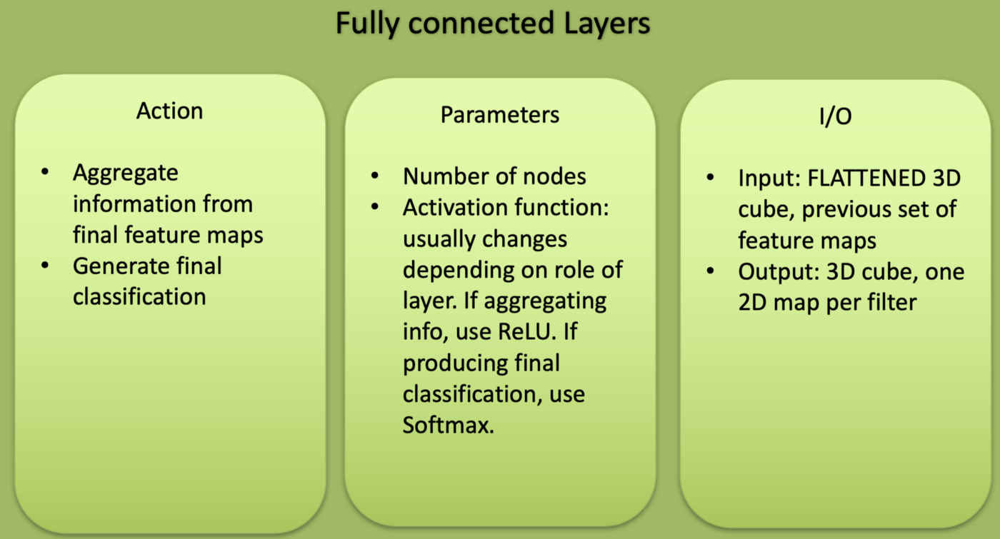

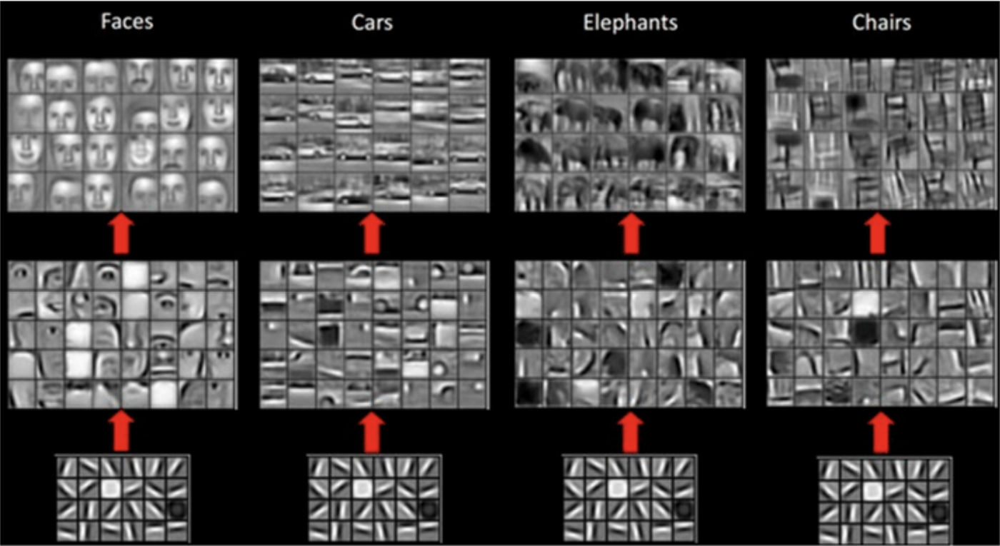

What do CNN layers learn?

- Each CNN layer learns filters of increasing complexity.

- The first layers learn basic feature detection filters: edges, corners, etc

- The middle layers learn filters that detect parts of objects. For faces, they might learn to respond to eyes, noses, etc

- The last layers have higher representations: they learn to recognize full objects, in different shapes and positions.

# 3D Example

https://www.cs.ryerson.ca/~aharley/vis/conv/

In [14]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(train_images, train_labels, epochs=10, 
                    validation_data=(test_images, test_labels))

Epoch 1/10
1563/1563 [==============================] - 44s 28ms/step - loss: 1.5296 - accuracy: 0.4401 - val_loss: 1.3217 - val_accuracy: 0.5295
Epoch 2/10
1563/1563 [==============================] - 46s 29ms/step - loss: 1.1652 - accuracy: 0.5869 - val_loss: 1.0774 - val_accuracy: 0.6206
Epoch 3/10
1563/1563 [==============================] - 54s 35ms/step - loss: 1.0139 - accuracy: 0.6429 - val_loss: 0.9875 - val_accuracy: 0.6558
Epoch 4/10
1563/1563 [==============================] - 57s 37ms/step - loss: 0.9116 - accuracy: 0.6797 - val_loss: 1.0086 - val_accuracy: 0.6501
Epoch 5/10
1563/1563 [==============================] - 48s 30ms/step - loss: 0.8328 - accuracy: 0.7079 - val_loss: 0.9246 - val_accuracy: 0.6816
Epoch 6/10
1563/1563 [==============================] - 45s 29ms/step - loss: 0.7791 - accuracy: 0.7272 - val_loss: 0.8879 - val_accuracy: 0.7009
Epoch 7/10
1563/1563 [==============================] - 40s 26ms/step - loss: 0.7334 - accuracy: 0.7421 - val_loss: 0.8721 -

In [652]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

10000/10000 - 1s - loss: 0.9231 - accuracy: 0.6943


In [ ]:
print(test_acc)

## tutorial uses a filtered version of Dogs vs Cats dataset from Kaggle.
https://www.tensorflow.org/tutorials/images/classification

https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

https://www.pyimagesearch.com/2018/12/31/keras-conv2d-and-convolutional-layers/

1º Super Fluidez - Modelo DAIN y App:
https://github.com/baowenbo/DAIN

https://grisk.itch.io/dain-app

2º Super Resolución - TecoGAN y Notebook:
https://github.com/thunil/TecoGAN

https://colab.research.google.com/git...

3º Colorización - DeOldify:
https://github.com/jantic/DeOldify


4 Tensorflow Object Detection API
https://github.com/tensorflow/models/tree/master/research/object_detection

5 Awesome-lane-detection

https://github.com/amusi/awesome-lane-detection#2020




In [16]:
!open .